In [4]:
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
import os
import sys
from scipy.stats import pearsonr
import seaborn as sns
import HERGAST
import torch
import torch.nn as nn
import torch.optim as optim
import anndata as ad
from tqdm import tqdm
import time
from SpaLP.utils import prepare_inputs, set_seed,create_new_color_dict,Graph
from SpaLP.LP import SpatialLocalPooling
from scipy.stats import rankdata
import random
def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True 
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.benchmark = False

plt.rcParams["figure.figsize"] = (9, 8)

# helper functions
def plot_gene_dist(adata,i,layer=None,num_bin=30,save=None):

    if layer is not None:
        df = pd.DataFrame({'value':adata.layers[layer][:,i],'mark':adata.obs['mark_area'].to_list()})
    else:
        df = pd.DataFrame({'value':adata.X[:,i],'mark':adata.obs['mark_area'].to_list()})
    
    # 设置绘图风格
    sns.set_theme(style="white")
    palette = {
    '0': '#6384BA',
    '1': '#E39C73'
    }

    plt.figure(figsize=(9, 6))
    sns.histplot(data=df, x='value', hue='mark', bins=num_bin, alpha=0.5, element='step',common_norm=False, stat='density',palette=palette)
    
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['left'].set_visible(True)
    plt.gca().spines['bottom'].set_visible(True)
    plt.legend().set_visible(False)
    plt.xlabel('')
    plt.ylabel('')

    if save is not None:
        plt.savefig(save)
    else:
        plt.show()

def min_max_norm(data):
    # Min-Max 
    min_vals = data.min(axis=0)  
    max_vals = data.max(axis=0)  
    normalized_data = (data - min_vals) / (max_vals - min_vals)
    return normalized_data

def compute_all_metrics(Y_true, Y_pred):
    if hasattr(Y_true, "toarray"): Y_true = Y_true.toarray()
    if hasattr(Y_pred, "toarray"): Y_pred = Y_pred.toarray()
    def vectorized_pcc(X, Y):
        X_centered = X - X.mean(axis=0)
        Y_centered = Y - Y.mean(axis=0)
        numerator = np.sum(X_centered * Y_centered, axis=0)
        denominator = np.sqrt(np.sum(X_centered**2, axis=0)) * np.sqrt(np.sum(Y_centered**2, axis=0))
        return numerator / (denominator + 1e-12) #
    
    pcc_per_gene = vectorized_pcc(Y_true, Y_pred)
    
    Y_true_ranked = np.apply_along_axis(rankdata, 0, Y_true)
    Y_pred_ranked = np.apply_along_axis(rankdata, 0, Y_pred)
    spcc_per_gene = vectorized_pcc(Y_true_ranked, Y_pred_ranked)

    return np.mean(pcc_per_gene), np.mean(spcc_per_gene),pcc_per_gene, spcc_per_gene

def error_metrics(gt_norm, pred_norm):
    # gt/pred: (N, G)
    err = pred_norm - gt_norm
    rmse = np.sqrt(np.mean(err**2))
    mae  = np.mean(np.abs(err))
    # per gene
    gene_rmse = np.sqrt(np.mean(err**2, axis=0))
    gene_mae  = np.mean(np.abs(err), axis=0)
   
    return rmse, mae, gene_rmse, gene_mae


In [5]:
set_seed(7)

================================== pattern:pattern7  ===================================


Training: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [00:06<00:00, 31.07it/s, Epoch=199, Loss=7.6440]



Metric     | mask_region_Reconstructed (SpaLP) | mask_region Input     
------------------------------------------------------------
mask_region_PCC | 0.8261 (Higher is better)    | 0.0000
mask_region_SPCC | 0.3702 (Higher is better)    | 0.0000
mask_region_RMSE | 0.1108 (Lower is better)     | 0.2080
mask_region_MAE | 0.0801 (Lower is better)     | 0.1460
================================== pattern:pattern8  ===================================


Training: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [00:06<00:00, 31.07it/s, Epoch=199, Loss=5.1051]



Metric     | mask_region_Reconstructed (SpaLP) | mask_region Input     
------------------------------------------------------------
mask_region_PCC | 0.7489 (Higher is better)    | 0.0000
mask_region_SPCC | 0.1800 (Higher is better)    | 0.0000
mask_region_RMSE | 0.0761 (Lower is better)     | 0.1649
mask_region_MAE | 0.0532 (Lower is better)     | 0.1195
================================== pattern:pattern4  ===================================


Training: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [00:06<00:00, 31.06it/s, Epoch=199, Loss=9.2879]



Metric     | mask_region_Reconstructed (SpaLP) | mask_region Input     
------------------------------------------------------------
mask_region_PCC | 0.8464 (Higher is better)    | 0.0000
mask_region_SPCC | 0.4763 (Higher is better)    | 0.0000
mask_region_RMSE | 0.1168 (Lower is better)     | 0.2320
mask_region_MAE | 0.0834 (Lower is better)     | 0.1642
================================== pattern:pattern2  ===================================


Training: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [00:06<00:00, 31.04it/s, Epoch=199, Loss=7.7226]



Metric     | mask_region_Reconstructed (SpaLP) | mask_region Input     
------------------------------------------------------------
mask_region_PCC | 0.8166 (Higher is better)    | 0.0000
mask_region_SPCC | 0.3753 (Higher is better)    | 0.0000
mask_region_RMSE | 0.1002 (Lower is better)     | 0.2091
mask_region_MAE | 0.0710 (Lower is better)     | 0.1468
================================== pattern:pattern5  ===================================


Training: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [00:06<00:00, 31.21it/s, Epoch=199, Loss=7.5651]



Metric     | mask_region_Reconstructed (SpaLP) | mask_region Input     
------------------------------------------------------------
mask_region_PCC | 0.8229 (Higher is better)    | 0.0000
mask_region_SPCC | 0.3697 (Higher is better)    | 0.0000
mask_region_RMSE | 0.1019 (Lower is better)     | 0.2083
mask_region_MAE | 0.0732 (Lower is better)     | 0.1462
================================== pattern:pattern6  ===================================


Training: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [00:06<00:00, 31.10it/s, Epoch=199, Loss=7.5416]



Metric     | mask_region_Reconstructed (SpaLP) | mask_region Input     
------------------------------------------------------------
mask_region_PCC | 0.8364 (Higher is better)    | 0.0000
mask_region_SPCC | 0.3678 (Higher is better)    | 0.0000
mask_region_RMSE | 0.0965 (Lower is better)     | 0.2074
mask_region_MAE | 0.0688 (Lower is better)     | 0.1456
================================== pattern:pattern1  ===================================


Training: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [00:06<00:00, 31.03it/s, Epoch=199, Loss=11.8971]



Metric     | mask_region_Reconstructed (SpaLP) | mask_region Input     
------------------------------------------------------------
mask_region_PCC | 0.8708 (Higher is better)    | 0.0000
mask_region_SPCC | 0.6131 (Higher is better)    | 0.0000
mask_region_RMSE | 0.1607 (Lower is better)     | 0.2642
mask_region_MAE | 0.1172 (Lower is better)     | 0.1930
================================== pattern:pattern3  ===================================


Training: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [00:06<00:00, 31.07it/s, Epoch=199, Loss=6.0828]



Metric     | mask_region_Reconstructed (SpaLP) | mask_region Input     
------------------------------------------------------------
mask_region_PCC | 0.7803 (Higher is better)    | 0.0000
mask_region_SPCC | 0.2624 (Higher is better)    | 0.0000
mask_region_RMSE | 0.0821 (Lower is better)     | 0.1838
mask_region_MAE | 0.0566 (Lower is better)     | 0.1301


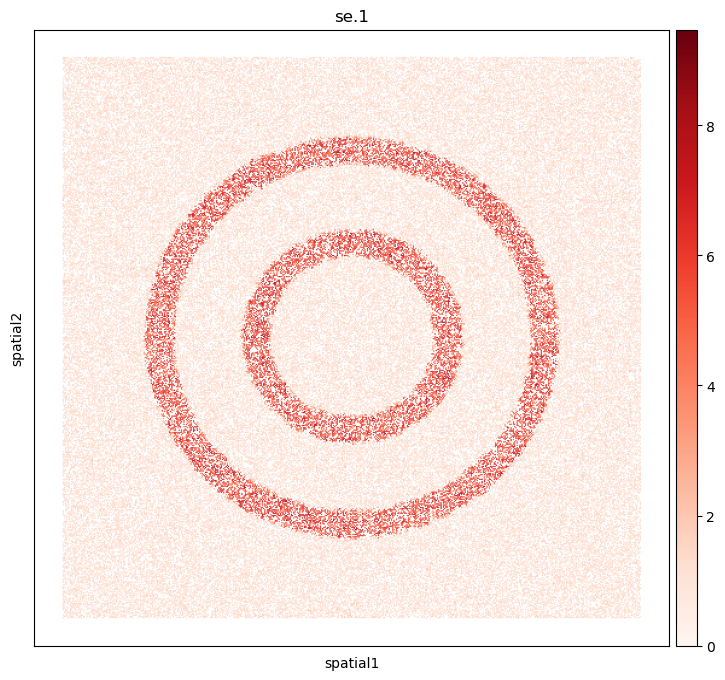

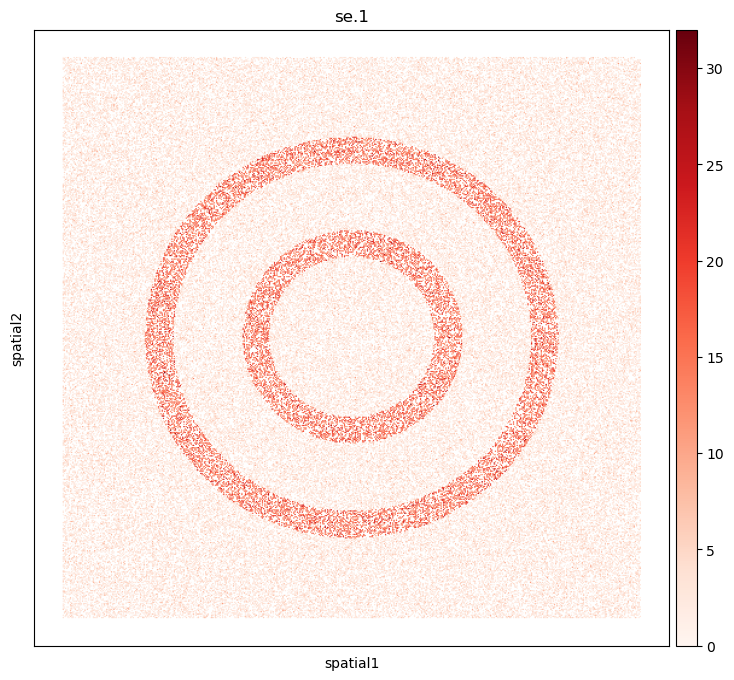

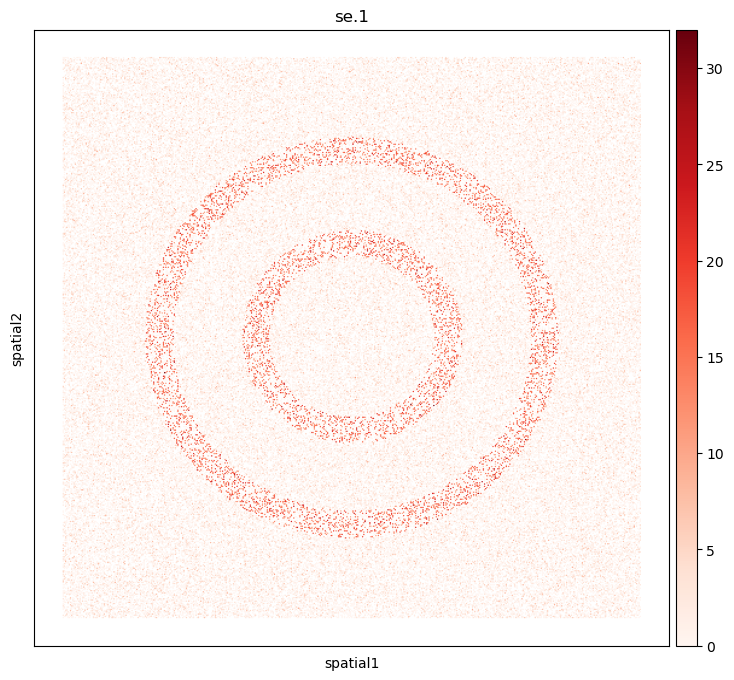

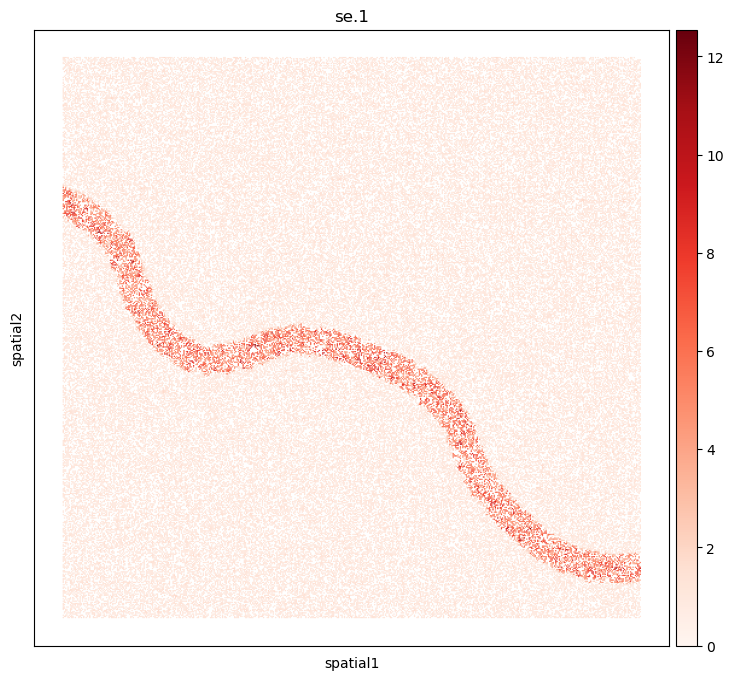

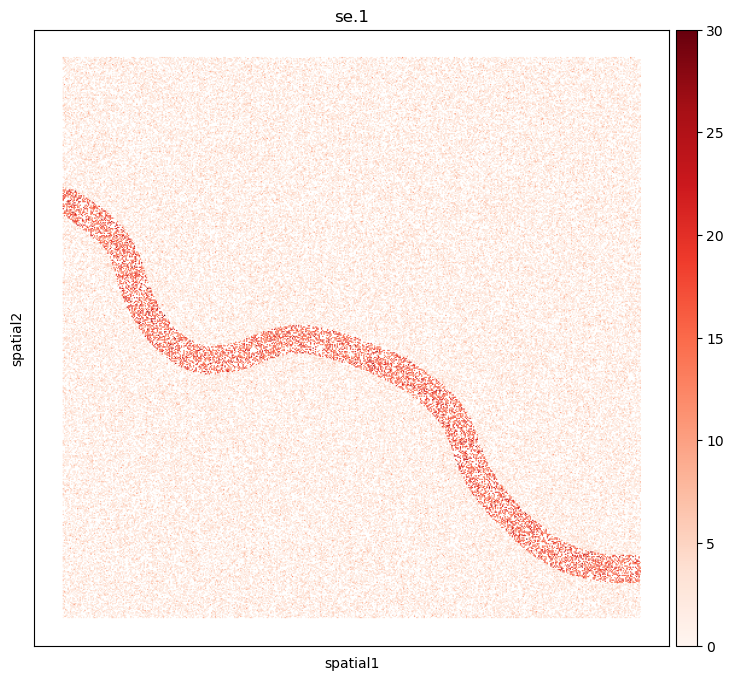

...

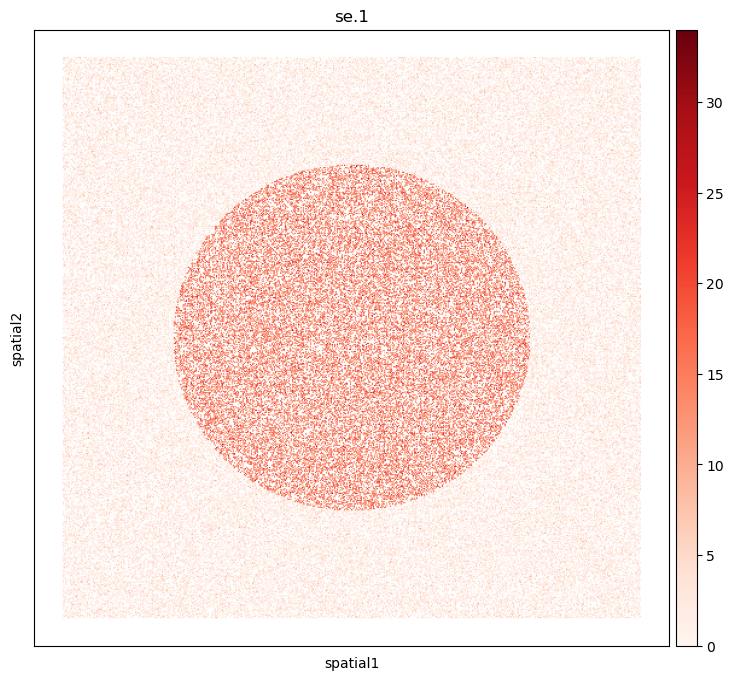

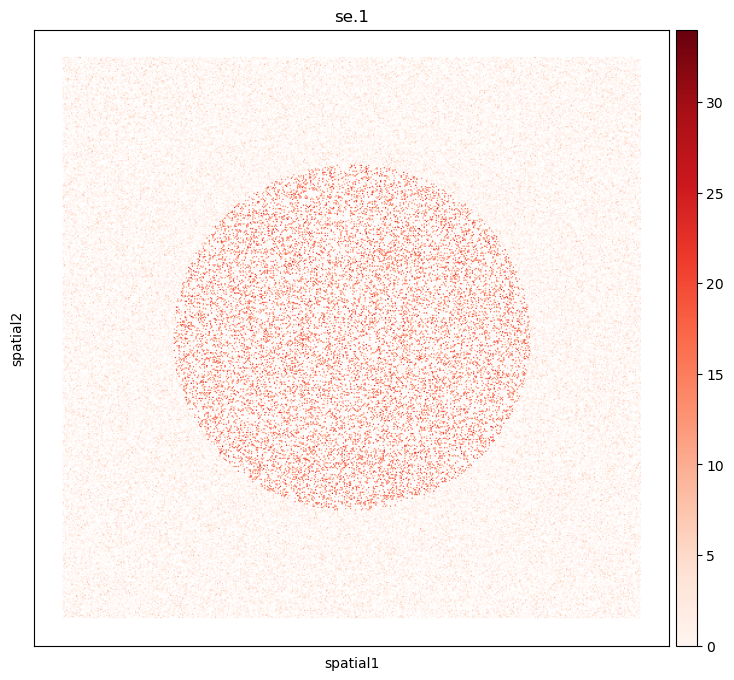

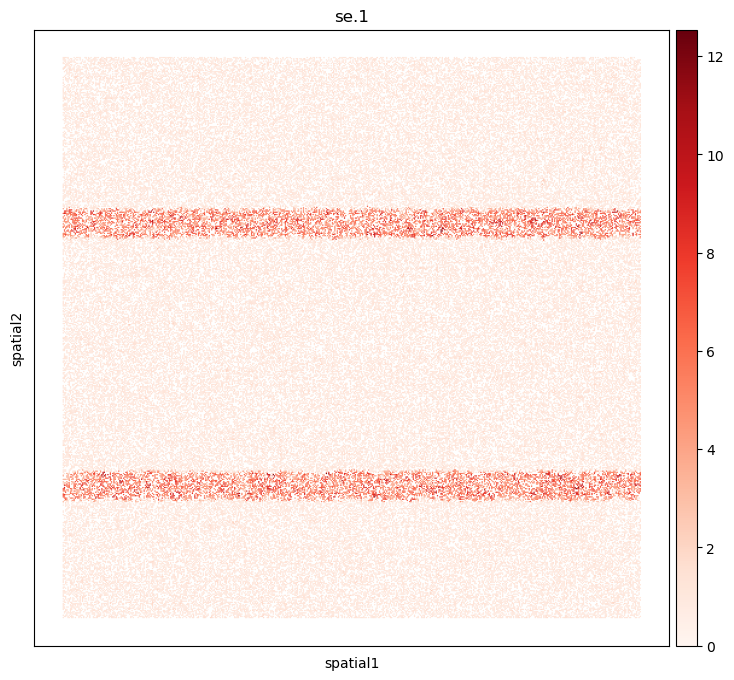

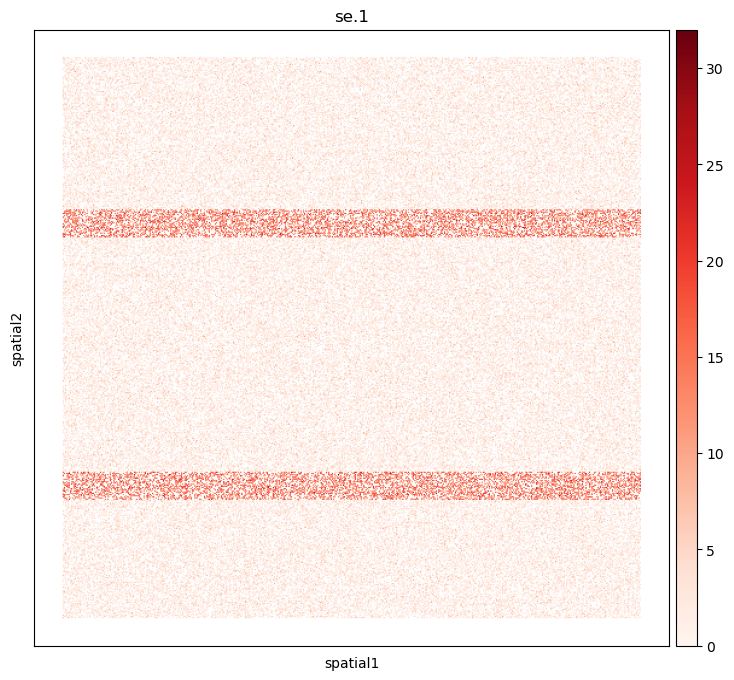

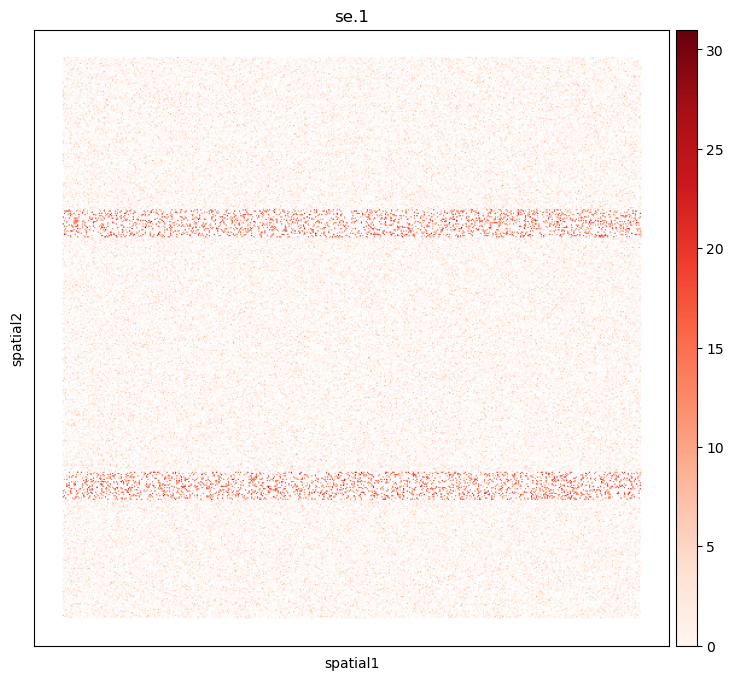

In [6]:
dist_mapping={'0':'ZIP','1':'ZINB'}
dist = dist_mapping['0']
patterns = [f for f in os.listdir('.') if f.endswith('.png')]
device= torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
for ptn in patterns:
    res_dir = ptn.split('.')[0]
    print(f'================================== pattern:{res_dir}  ===================================')
    res_dir = f'{dist}/{res_dir}'
    if not os.path.exists(res_dir):
        os.makedirs(res_dir)
    current_img_dir = '.' 
    if dist=='ZINB':
        adata = HERGAST.utils.simulate_gene(spots=160000,type='ZINB',ptn=ptn,png_dir=current_img_dir, se_mu=20,se_size=20,ns_mu=2,ns_size=2,se_p=0.01,ns_p=0.01)
        adata.layers['gt'] = adata.X.copy()
    elif dist=='ZIP':
        adata = HERGAST.utils.simulate_gene(spots=160000,type='ZIP',ptn=ptn,png_dir=current_img_dir, se_mu=15,ns_mu=3,se_p=0.01,ns_p=0.01)
        adata.layers['gt'] = adata.X.copy()

    #60% entries held-out cells
    HELDOUT_RATIO = 0.60  
    rng = np.random.default_rng(7)
    N = adata.shape[0]
    cell_mask = rng.random(N) < HELDOUT_RATIO   # (N,)
    mask = np.broadcast_to(cell_mask[:, None], adata.shape)  # (cells, genes)
    adata.obs['mask'] = cell_mask
    adata.layers['mask'] = mask
    
    adata.layers['input_masked'] = adata.layers['gt'].copy()
    adata.layers['input_masked'][mask] = 0.0
    adata.X = adata.layers['input_masked'].copy()

    
    adata.obsm['feat']=adata.X
    
    graph = prepare_inputs(adata,k=8,device=device)
    in_channels = graph.features.shape[1]
    model = SpatialLocalPooling(in_channels, out_channels=50).to(device)
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)
    
    set_seed(7)
    epochs = 200
    pbar = tqdm(range(epochs), desc="Training",ncols=200)
    for epoch in pbar:
        start_time = time.time()
        model.train()
        optimizer.zero_grad()
        reconstructed,embedding = model(graph.features, graph.neighbor_idx)
        loss = criterion(reconstructed, graph.features)
        loss.backward()
        optimizer.step()
        elapsed = time.time() - start_time
        pbar.set_postfix({"Epoch": epoch,"Loss": f"{loss.item():.4f}"})
    model.eval()
    with torch.no_grad():
        reconstructed,embedding = model(graph.features, graph.neighbor_idx)
        reconstructed = reconstructed.cpu().numpy()
        embedding=embedding.cpu().numpy()

    
    adata.layers['rex'] = reconstructed
    adata.layers['gt_norm'] = min_max_norm(adata.layers['gt'])
    adata.layers['rex_norm'] = min_max_norm(adata.layers['rex'])
    adata.layers['input_masked_norm'] = min_max_norm(adata.layers['input_masked'])
    
    gt_data = adata.layers['gt'][:, :50]
    rex_data = adata.layers['rex'][:, :50]
    input_masked_data = adata.layers['input_masked'][:, :50]
    
    gt_norm_data = adata.layers['gt_norm'][:, :50]
    rex_norm_data = adata.layers['rex_norm'][:, :50]
    input_masked_norm_data = adata.layers['input_masked_norm'][:, :50]
    

    # Held-out region Reconstructed (Rex) vs Ground Truth
    mask = adata.layers['mask'][:, :50]
    gt_data_mask=gt_data[mask]
    rex_data_mask=rex_data[mask]
    input_masked_data_mask=input_masked_data[mask]

    gt_norm_data_mask = gt_norm_data[mask]
    rex_norm_data_mask = rex_norm_data[mask]
    input_masked_norm_data_mask = input_masked_norm_data[mask]
    
    rex_pcc_mask, rex_spcc_mask,pcc_per_gene_mask, spcc_per_gene_mask = compute_all_metrics(gt_data_mask, rex_data_mask)
    noise_pcc_mask, noise_spcc_mask,noise_pcc_per_gene_mask,noise_spcc_per_gene_mask = compute_all_metrics(rex_data_mask, input_masked_data_mask)
    
    rmse_mask, mae_mask, rmse_per_gene_mask, mae_per_gene_mask=error_metrics(gt_norm_data_mask,rex_norm_data_mask)
    noise_rmse_mask, noise_mae_mask, noise_rmse_per_gene_mask, noise_mae_per_gene_mask=error_metrics(gt_norm_data_mask,input_masked_norm_data_mask)
    
    rex_df = pd.DataFrame({"Methods": ["SpaLP"] * 50,"Gene": adata.var_names[:50],"PCC": pcc_per_gene_mask,"SPCC": spcc_per_gene_mask,"RMSE":rmse_per_gene_mask,"MAE":mae_per_gene_mask,"pattern":res_dir,'Held-out':'60%'},)
    
    # Noise vs GT
    noise_df = pd.DataFrame({"Methods": ["Mask"] * 50,"Gene": adata.var_names[:50],"PCC": noise_pcc_per_gene_mask,"SPCC": noise_spcc_per_gene_mask,"RMSE":noise_rmse_per_gene_mask,"MAE":noise_mae_per_gene_mask,"pattern":res_dir,'Held-out':'60%'})
    
    rex_df.to_csv(f"{res_dir}/SpaLP_0.6_rex_vs_gt_correlation.csv", index=False)
    noise_df.to_csv(f"{res_dir}/mask_0.6_vs_gt_correlation.csv", index=False)
    
    print(f"\n{'Metric':<10} | {'mask_region_Reconstructed (SpaLP)':<22} | {'mask_region Input':<22}")
    print("-" * 60)
    print(f"{'mask_region_PCC':<10} | {rex_pcc_mask:.4f}{' (Higher is better)':<22} | {noise_pcc_mask:.4f}")
    print(f"{'mask_region_SPCC':<10} | {rex_spcc_mask:.4f}{' (Higher is better)':<22} | {noise_spcc_mask:.4f}")
    print(f"{'mask_region_RMSE':<10} | {rmse_mask:.4f}{' (Lower is better)':<22} | {noise_rmse_mask:.4f}")
    print(f"{'mask_region_MAE':<10} | {mae_mask:.4f}{' (Lower is better)':<22} | {noise_mae_mask:.4f}")

    sc.pl.embedding(adata,basis='spatial',color=f'se.1',cmap='Reds',layer='rex',show=False,size=4)
    plt.savefig(f'{res_dir}/SpaLP_0.6_svg_sp_rex.png')
    sc.pl.embedding(adata,basis='spatial',color=f'se.1',cmap='Reds',layer='gt',show=False,size=4)
    plt.savefig(f'{res_dir}/0.6_svg_sp_gt.png')
    sc.pl.embedding(adata,basis='spatial',color=f'se.1',cmap='Reds',layer='input_masked',show=False,size=4)
    plt.savefig(f'{res_dir}/0.6_svg_sp_input_masked.png')
    
    #import pandas as pd